In [67]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import math
from tqdm import tqdm
import matplotlib.image as mpimg
from pathlib import Path
import glob
import copy

In [68]:
# Load Image from directory
def load_image():
    file_name = []
    file_path = []
    for file in glob.glob('./sample_images/*'):
        file_name.append(Path(file).stem)
        file_path.append(file)
    return file_name, file_path
# Show the original image and the respective histogram
def show_ori_image_hist (file_name, file_path):
    fig, axs = plt.subplots(8, 2, figsize = (15,45))
    img = []

    for i in range (len(file_name)):
        file = file_path[i]
        image = cv2.imread(file) 
        img.append(image)

        axs[i, 0].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
        axs[i, 0].set_title(f'{file_name[i]}')
        axs[i, 0].axis('off')

        line_colour = ['b','g','r']

        for j in range (len(line_colour)):
            hist = cv2.calcHist([image],[j],None,[256],[0,256])
            axs[i,1].plot(hist,line_colour[j])
            axs[i,1].set_title('Histogram')
    
    return img

# Get image with different colour space
def get_img_color_space(img):
    img_bgr = []
    img_rgb = []
    img_lab = []
    img_hsv = []
    img_ycbcr = []

    # fig, axs = plt.subplots(8, 5, figsize=(15,15))

    for i in range(len(img)):
        image = img[i]

        # Colour channels in cv2: BGR
        img_bgr.append(image)
        # axs[i, 0].imshow(image)
        # axs[i, 0].set_title('BGR Image')
        # axs[i, 0].axis('off')

        # Convert BGR to RGB
        image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        img_rgb.append(image_rgb)
        # axs[i, 1].imshow(image_rgb)
        # axs[i, 1].set_title('RGB Image')
        # axs[i, 1].axis('off')

        # Convert BGR to LAB
        image_lab = cv2.cvtColor(image, cv2.COLOR_BGR2LAB)
        img_lab.append(image_lab)
        # axs[i, 2].imshow(image_lab)
        # axs[i, 2].set_title('LAB Image')
        # axs[i, 2].axis('off')

        # Convert BGR to HSV
        image_hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
        img_hsv.append(image_hsv)
        # axs[i, 3].imshow(image_hsv)
        # axs[i, 3].set_title('HSV Image')
        # axs[i, 3].axis('off')
        
        # Convert BGR to YCbCr
        image_ycbcr = cv2.cvtColor(image, cv2.COLOR_BGR2YCrCb)
        img_ycbcr.append(image_ycbcr)
        # axs[i, 4].imshow(image_ycbcr)
        # axs[i, 4].set_title('YCbCr Image')
        # axs[i, 4].axis('off')

        plt.tight_layout()
    
    return img_bgr, img_rgb, img_lab, img_hsv, img_ycbcr

C:\Users\user\AppData\Local\Temp\ipykernel_24604\3932243505.py:79: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


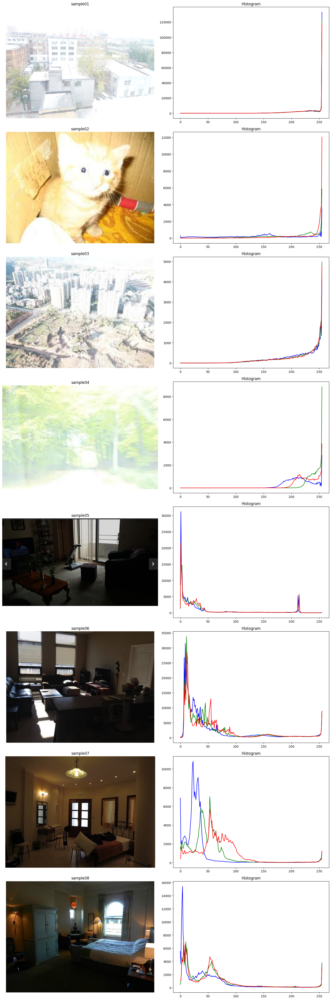

In [69]:
name, path = load_image()
img = show_ori_image_hist(name, path)
img_bgr, img_rgb, img_lab, img_hsv, img_ycbcr = get_img_color_space(img)

In [70]:
tri = [(img_lab, 0), (img_hsv, 2), (img_ycbcr, 0)]

In [71]:
def display(images, names):
    no = len(images)
    row = math.ceil(no/2)
    plt.figure(figsize=(10, 6))
    for i in range(no):
        plt.subplot(row, 2, i+1)
        plt.imshow(images[i])
        if not len(name):
            plt.title(names[i])
        plt.axis('off')

def displayColorSpace(_tri):
    """
    _tri should be in order [origin, lab, hsv, ycbcr]
    """
    col = len(_tri[0])
    row = len(_tri)
    # plt.figure(figsize=(10, 6))
    fig, ax = plt.subplots(row, col, figsize=(12, 6))
    for i in range(row):
        for j in range(col):
            if i == 1:
                temp = cv2.cvtColor(_tri[i][j], cv2.COLOR_LAB2RGB)
            elif i == 2:
                temp = cv2.cvtColor(_tri[i][j], cv2.COLOR_HSV2RGB)
            elif i == 3:
                temp = cv2.cvtColor(_tri[i][j], cv2.COLOR_YCrCb2RGB)
            else:
                temp = _tri[i][j]
            plt.subplot(row, col, i*col+j+1)
            plt.imshow(temp)
            plt.axis('off')
        ax[i,0].set_title('Original Image')
        ax[i,1].set_title('LAB')
        ax[i,2].set_title('HSV')
        ax[i,3].set_title('YCbCr')
    # y_label = ['origin', 'LAB', 'HSV', 'YCbCr']
    # for ax, row in zip(axs[:,0], y_label):
    #     ax.set_ylabel(row, rotation=0, size='large')
    fig.suptitle('Histogram Equalization')
    plt.tight_layout()
    plt.show()

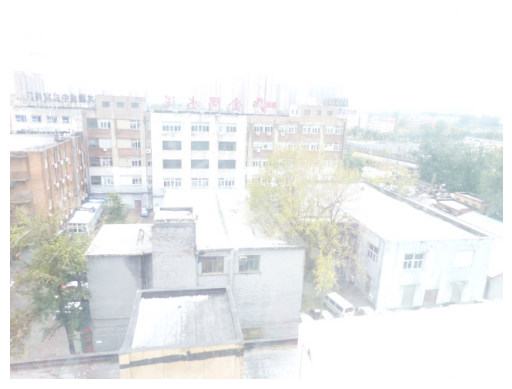

In [72]:
imgs = cv2.imread('sample_images/sample01.jpg')
if imgs is None:
    print("Error: Unable to load image")
    exit()
img = cv2.cvtColor(imgs, cv2.COLOR_BGR2RGB)
plt.imshow(img)
plt.axis('off')
plt.show()

In [73]:
type(img)
img.shape

(480, 640, 3)

In [74]:
# def hist_equal(imgn):
#     normalized = []
#     n, bins, patches = plt.hist(imgn)
#     for i in range(bins):
#         normalized.append(n[i]/sum(n))

#     normalized[0] *= bins-1
#     for i in range(1,bins):
#         normalized[i] = normalized[i]*(bins-1) + normalized[i-1]
#         normalized[i-1] = round(normalized[i-1])
#     normalized[bins-1] = round(normalized[i-1])

In [75]:
def lab(img):
    lab_img = cv2.cvtColor(img, cv2.COLOR_RGB2LAB)
    l, a, b = cv2.split(lab_img)
    return l, a, b
l,a,b = lab(img)

In [76]:
def he(origin):
    img = origin.copy()
    s = np.shape(img)
    img = np.reshape(img, s[0]*s[1])
    bins = range(257)
    bins = np.array(bins) - 0.5
    counts, bins = np.histogram(img, bins = bins)
    pdf = counts / counts.sum()
    cdf = np.zeros(256)
    for i in range(256):
        cdf[i] = cdf[max(0,i-1)] + pdf[i]
    cdf = cdf * 255
    cdf = np.round(cdf)
    return cdf
        
normalized_l = he(l)
# print(normalized_l)

(-0.5, 639.5, 479.5, -0.5)

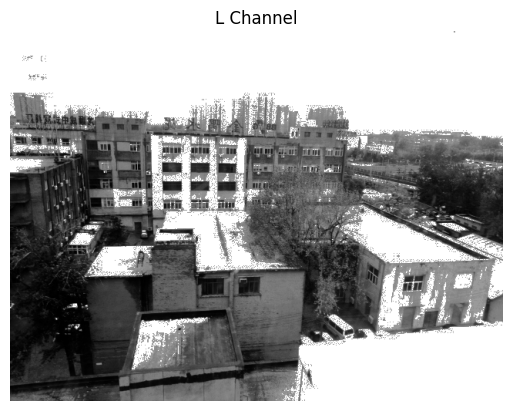

In [77]:
def apply(channel, normal):
    res = np.zeros(np.shape(channel))
    sh = np.shape(channel)
    for i in range(sh[0]):
        for j in range(sh[1]):
            res[i][j] = normal[channel[i][j]]
    return res
res = apply(l, normalized_l)
plt.imshow(res, cmap='gray')
plt.title('L Channel')
plt.axis('off')

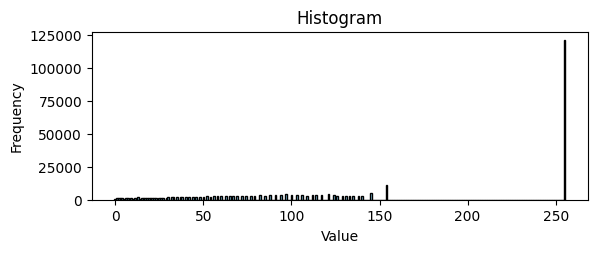

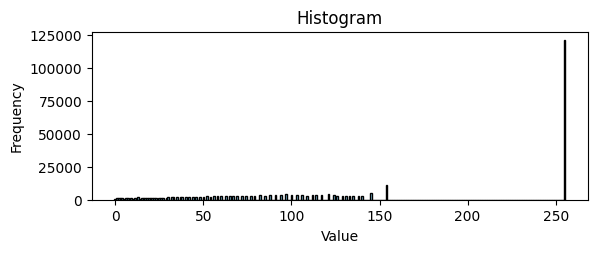

In [78]:
bins = range(257)
bins = np.array(bins) - 0.5
CV2_normalized_l = cv2.equalizeHist(l)
plt.subplot(2, 1, 1)
plt.hist(CV2_normalized_l.reshape(-1), bins=bins, color='skyblue', edgecolor='black')
plt.xlabel('Value')
plt.ylabel('Frequency')
plt.title('Histogram')
plt.show()

plt.subplot(2, 1, 2)
plt.hist(res.reshape(-1), bins=bins, color='skyblue', edgecolor='black')
plt.xlabel('Value')
plt.ylabel('Frequency')
plt.title('Histogram')
plt.show()

In [79]:
def cvtRGB(_imgs, cvt):
    _res = list()
    for img in _imgs:
        _res.append(cv2.cvtColor(img, cvt))
    return _res

In [80]:
def resize(arr, shape):
    if arr.shape != shape:
        arr = cv2.resize(arr, (shape[0], shape[1]))
    return arr.astype(np.uint8)

In [81]:
def lab_he(_img):
    _l, _a, _b = lab(_img)
    normalized = he(_l)
    _res = apply(_l, normalized)
    img_shape = _img.shape[:2]
    _res = resize(_res, img_shape)
    _a = resize(_a, img_shape)
    _b = resize(_b, img_shape)
    return _res, _a, _b

In [82]:

def all_he(_imgs, channel=0):
    """
    Can use for all color space image list
    channel = 0/1/2 indicate the interested channel
    """
    # _ress = _imgs.copy()
    _ress = copy.deepcopy(_imgs)
    for _img in _ress:
        # _a, _b, _c = cv2.split(_img)
        # if channel == 0:
        #     _target = _a
        # elif channel == 1:
        #     _target = _b
        # else:
        #     _target = _c
        # if np.ndim(_img) == 3:
        _target = _img[:,:,channel]
        # elif np.ndim(_img) == 2:
        #     _target = _img[:,channel]
        normalized = he(_target)
        _res = apply(_target, normalized)
        img_shape = _img.shape[:2]
        _res = resize(_res, img_shape)
        _img[:,:,channel] = _res
    return _ress
 

(-0.5, 639.5, 479.5, -0.5)

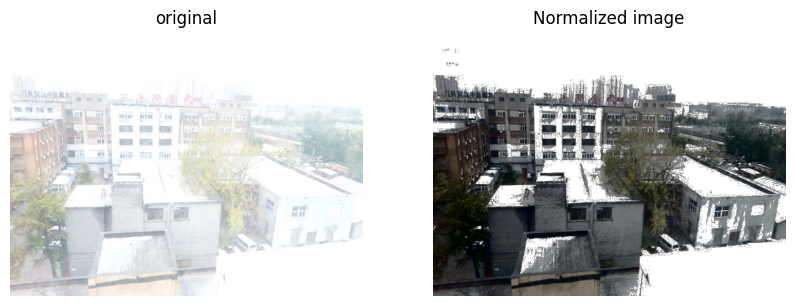

In [83]:
# res = cv2.resize(res, (a.shape[1], a.shape[0]))
# b = cv2.resize(b, (a.shape[1], a.shape[0]))
# res = res.astype(np.uint8)
# lab_image = cv2.merge([res, a, b])
lab_image = all_he([cv2.cvtColor(img, cv2.COLOR_RGB2LAB)])[0]
rgb_image = cv2.cvtColor(lab_image, cv2.COLOR_LAB2BGR)
rgb_image = cv2.cvtColor(rgb_image, cv2.COLOR_BGR2RGB)
# a_rgb = 
plt.figure(figsize=(10, 6))

plt.subplot(1, 2, 1)
plt.imshow(img)
plt.title('original')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(rgb_image)
plt.title('Normalized image')
plt.axis('off')

In [84]:
lab_he_result = all_he(img_lab, 0)
hsv_he_result = all_he(img_hsv, 2)
ycbcr_he_result = all_he(img_ycbcr, 0)

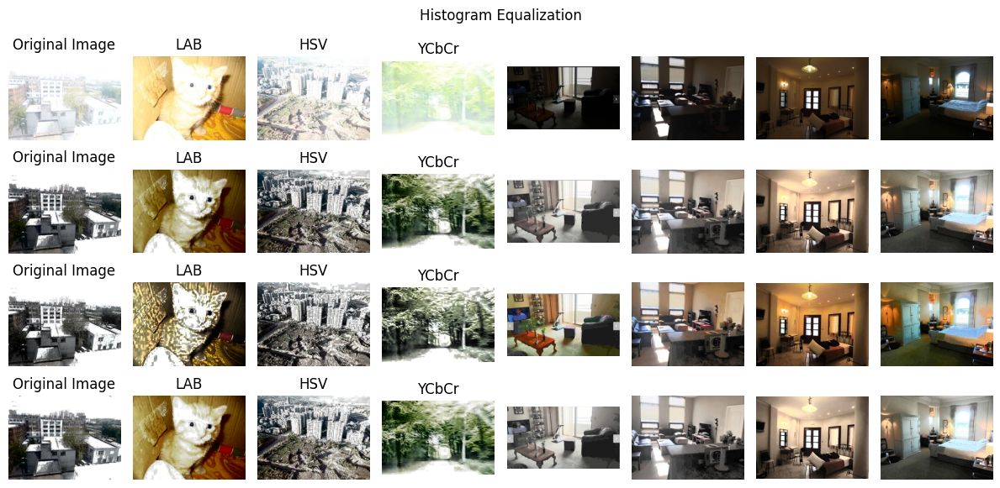

In [85]:
# display(cvtRGB(lab_he_result, cv2.COLOR_LAB2RGB) , [])
displayColorSpace([img_rgb, lab_he_result, hsv_he_result, ycbcr_he_result])

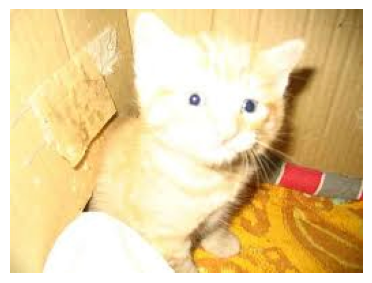

In [99]:
display([cvtRGB([img_lab[1]], cv2.COLOR_Lab2RGB)[0]], [])

Adaptive histogram equalization

In [88]:
def ahe(_img, _kernel_size=(16,16)):
    shape = _img.shape
    h = math.ceil(shape[0]/_kernel_size[0])
    w = math.ceil(shape[1]/_kernel_size[1])
    _res = np.zeros(shape, dtype=np.uint8)
    for i in range(h):
        for j in range(w):
            _l, _a, _b = lab_he(_img[i*_kernel_size[0]:min((i+1)*_kernel_size[0], shape[0]), j*_kernel_size[1]:min((j+1)*_kernel_size[1], shape[1]), :])
            _res[i*_kernel_size[0]:min((i+1)*_kernel_size[0], shape[0]), j*_kernel_size[1]:min((j+1)*_kernel_size[1], shape[1]), :] = cv2.merge([_l, _a, _b])
    return _res

def all_ahe(_img, channel, _kernel_size=(16,16)):
    shape = _img.shape
    h = math.ceil(shape[0]/_kernel_size[0])
    w = math.ceil(shape[1]/_kernel_size[1])
    _res = np.zeros(shape, dtype=np.uint8)
    for i in range(h):
        for j in range(w):
            temp = all_he([_img[i*_kernel_size[0]:min((i+1)*_kernel_size[0], shape[0]), j*_kernel_size[1]:min((j+1)*_kernel_size[1], shape[1]), :]], channel)
            _res[i*_kernel_size[0]:min((i+1)*_kernel_size[0], shape[0]), j*_kernel_size[1]:min((j+1)*_kernel_size[1], shape[1]), :] = temp[0]
    return _res

def aheForList(_imgs, channel=0, _kernel_size=(64,64)):
    _res = list()
    for _img in _imgs:
        _res.append(all_ahe(_img, channel, _kernel_size)) 
    return _res

(-0.5, 639.5, 479.5, -0.5)

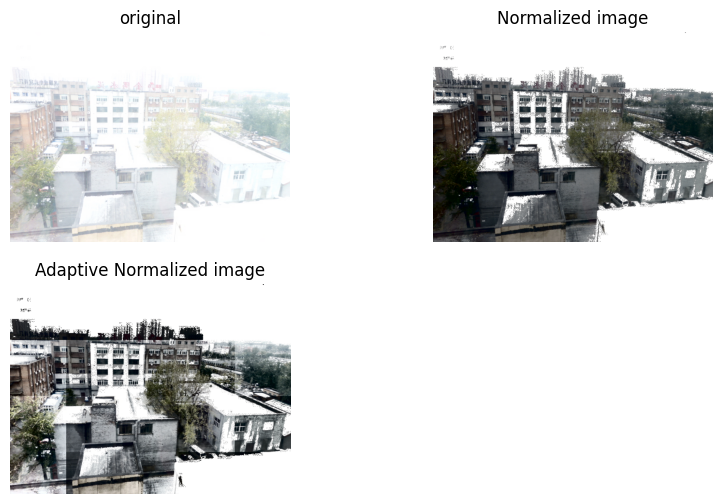

In [89]:
ahe_img = aheForList([cv2.cvtColor(img, cv2.COLOR_RGB2LAB)], 0, (128, 128))[0]
# ahe_img = ahe(img, (128,128))
ahe_img = cv2.cvtColor(ahe_img, cv2.COLOR_LAB2BGR)
ahe_img = cv2.cvtColor(ahe_img, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(10, 6))

plt.subplot(2, 2, 1)
plt.imshow(img)
plt.title('original')
plt.axis('off')

plt.subplot(2, 2, 2)
plt.imshow(rgb_image)
plt.title('Normalized image')
plt.axis('off')

plt.subplot(2, 2, 3)
plt.imshow(ahe_img)
plt.title('Adaptive Normalized image')
plt.axis('off')

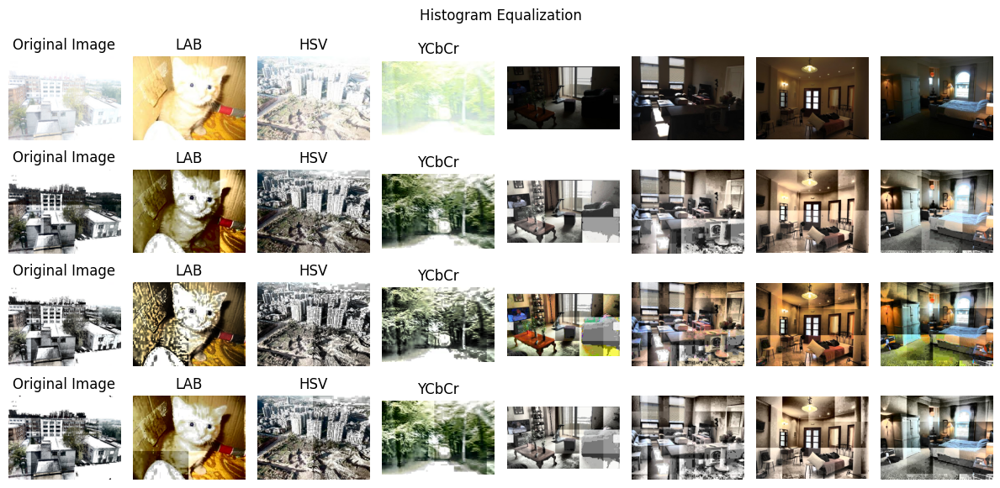

In [90]:
lab_ahe_result = aheForList(img_lab, 0, (200, 200))
hsv_ahe_result = aheForList(img_hsv, 2, (128, 128))
ycbcr_ahe_result = aheForList(img_ycbcr, 0, (128, 128))
displayColorSpace([img_rgb, lab_ahe_result, hsv_ahe_result, ycbcr_ahe_result])

In [24]:
def conv_ahe(_img, _kernel_size=(16,16)):
    shape = _img.shape
    count = np.zeros(shape)
    _res = np.zeros(shape)
    h = shape[0] - _kernel_size[0] + 1
    w = shape[1] - _kernel_size[1] + 1
    for i in tqdm(range(h)):
        for j in range(w):
            _l, _a, _b = lab_he(_img[i:i + _kernel_size[0], j:j + _kernel_size[1], :])
            _res[i:i + _kernel_size[0], j:j + _kernel_size[1], :] += cv2.merge([_l, _a, _b])
            count[i:i + _kernel_size[0], j:j + _kernel_size[1], :] += 1
    _res = _res/count
    return _res.astype(np.uint8)

def all_conv_ahe(_img, channel=0, _kernel_size=(64,64)):
    shape = _img.shape
    count = np.zeros(shape)
    _res = np.zeros(shape)
    h = shape[0] - _kernel_size[0] + 1
    w = shape[1] - _kernel_size[1] + 1
    for i in tqdm(range(h)):
        for j in range(w):
            temp = all_he([_img[i:i + _kernel_size[0], j:j + _kernel_size[1], :]], channel)
            _res[i:i + _kernel_size[0], j:j + _kernel_size[1], :] += temp[0]
            count[i:i + _kernel_size[0], j:j + _kernel_size[1], :] += 1
    _res = _res/count
    return _res.astype(np.uint8)

def conv_aheForList(_imgs, channel=0, _kernel_size=(64,64)):
    _res = list()
    for _img in _imgs:
        _res.append(all_conv_ahe(_img, channel, _kernel_size)) 
    return _res

In [95]:
conv_ahe_img = conv_aheForList([copy.deepcopy(img_lab[6])], 0, (64,64))[0]
conv_ahe_img = cv2.cvtColor(conv_ahe_img, cv2.COLOR_LAB2BGR)
conv_ahe_img = cv2.cvtColor(conv_ahe_img, cv2.COLOR_BGR2RGB)

100%|██████████| 345/345 [09:38<00:00,  1.68s/it]


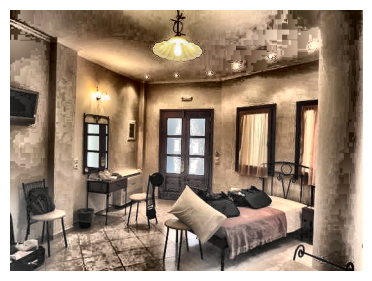

In [96]:
display([conv_ahe_img], [])

100%|██████████| 465/465 [00:48<00:00,  9.59it/s]


(-0.5, 639.5, 479.5, -0.5)

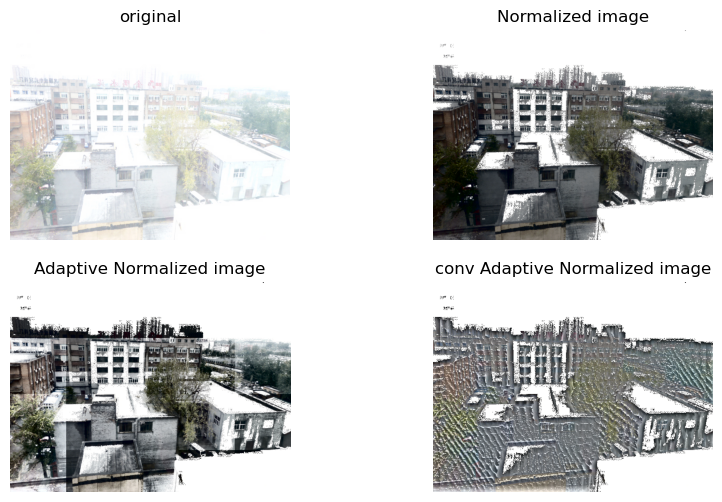

In [26]:
# conv_ahe_img = conv_ahe(img, (64, 64))
conv_ahe_img = conv_aheForList([cv2.cvtColor(img, cv2.COLOR_RGB2LAB)], 0, (16,16))[0]
conv_ahe_img = cv2.cvtColor(conv_ahe_img, cv2.COLOR_LAB2BGR)
conv_ahe_img = cv2.cvtColor(conv_ahe_img, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(10, 6))

plt.subplot(2, 2, 1)
plt.imshow(img)
plt.title('original')
plt.axis('off')

plt.subplot(2, 2, 2)
plt.imshow(rgb_image)
plt.title('Normalized image')
plt.axis('off')

plt.subplot(2, 2, 3)
plt.imshow(ahe_img)
plt.title('Adaptive Normalized image')
plt.axis('off')

plt.subplot(2, 2, 4)
plt.imshow(conv_ahe_img)
plt.title('conv Adaptive Normalized image')
plt.axis('off')

100%|██████████| 349/349 [03:16<00:00,  1.78it/s]


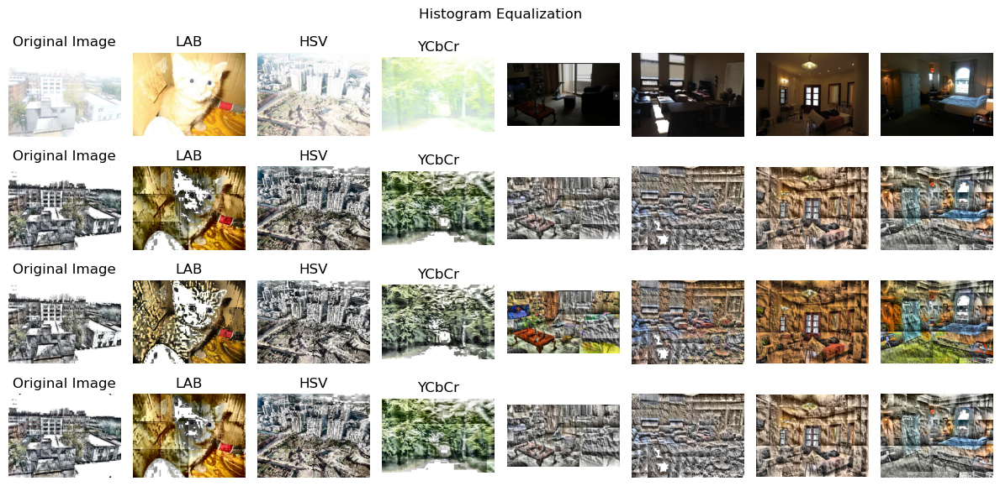

In [27]:
lab_conv_result = conv_aheForList(img_lab, 0)
hsv_conv_result = conv_aheForList(img_hsv, 2)
ycbcr_conv_result = conv_aheForList(img_ycbcr, 0)
displayColorSpace([img_rgb, lab_conv_result, hsv_conv_result, ycbcr_conv_result])

In [ ]:
conv_ahe_img = conv_aheForList([cv2.cvtColor(img, cv2.COLOR_RGB2LAB)], 0, (16,16))[0]
conv_ahe_img = cv2.cvtColor(conv_ahe_img, cv2.COLOR_LAB2BGR)
conv_ahe_img = cv2.cvtColor(conv_ahe_img, cv2.COLOR_BGR2RGB)

Interpolated AHE

In [103]:
def searchForSmallerNearestCenter(index, kernel_size, img_len):
    idx = index
    while idx >= 0:
        if (idx-math.floor(kernel_size/2))%kernel_size == 0:
            return idx
        else:
            idx = idx - 1
    return math.floor(kernel_size/2)

def searchForLargerNearestCenter(index, kernel_size, img_len):
    idx = index
    while idx < img_len:
        if (idx-math.floor(kernel_size/2))%kernel_size == 0:
            return idx
        else:
            idx = idx + 1
    return img_len - 1 - math.floor(kernel_size/2)

def searchForCorePoints(i, j, kernel, img_size):
    center = math.floor(kernel[0]/2)
    #Core points
    if ( ((i-center)%kernel[0] == 0) and ((j-center)%kernel[1] == 0) ):
        return np.array([[i, j]])
    #Edges & Corner
    if i <= center or j <= center or i >= img_size[0]-1-center or j >= img_size[1]-1-center:
        #Corners (1 points)
        if (i < center and j < center):
            return np.array([[center, center]])
        elif (i < center and j > img_size[1]-1-center):
            return np.array([[center, img_size[1] - 1 - center]])
        elif (i > img_size[0]-1-center and j < center):
            return np.array([[img_size[0]-1-center, center]])
        elif (i > img_size[0]-1-center and j >= img_size[1]-1-center):
            return np.array([[img_size[0]-1-center, img_size[1]-1-center]])
        else: #Not corners (2 points)
            if i <= center:
                ay = searchForSmallerNearestCenter(j, kernel[1], img_size[1])
                by = searchForLargerNearestCenter(j, kernel[1], img_size[1])
                ax = center
                bx = center
                if ay == by:
                    ax = bx = searchForLargerNearestCenter(i, kernel[0], img_size[0])
            elif j <= center:
                ax = searchForSmallerNearestCenter(i, kernel[0], img_size[0])
                bx = searchForLargerNearestCenter(i, kernel[0], img_size[0])
                ay = center
                by = center
                if ax == bx:
                    ay = by = searchForLargerNearestCenter(j, kernel[1], img_size[1])
            elif i >= img_size[0]-1-center:
                ay = searchForSmallerNearestCenter(j, kernel[1], img_size[1])
                by = searchForLargerNearestCenter(j, kernel[1], img_size[1])
                ax = img_size[0]-1-center
                bx = img_size[0]-1-center
                if ay == by:
                    ax = bx = searchForSmallerNearestCenter(i, kernel[0], img_size[0])
            elif j >= img_size[1]-1-center:
                ax = searchForSmallerNearestCenter(i, kernel[0], img_size[0])
                bx = searchForLargerNearestCenter(i, kernel[0], img_size[0])
                ay = img_size[1]-1-center
                by = img_size[1]-1-center
                if ax == bx:
                    ay = by = searchForSmallerNearestCenter(j, kernel[1], img_size[1])
            return np.array([[ax, ay], [bx, by]])
    #Body (4 points)
    else:
        minx = searchForSmallerNearestCenter(i, kernel[0], img_size[0])
        miny = searchForSmallerNearestCenter(j, kernel[1], img_size[1])
        maxx = searchForLargerNearestCenter(i, kernel[0], img_size[0])
        maxy = searchForLargerNearestCenter(j, kernel[1], img_size[1])
        return np.array([[minx, miny], [minx, maxy], [maxx, miny], [maxx, maxy]])

def interpolate(_a, _b, av, bv, t):
    # print(_a, _b, av, bv, t)
    return round(min(255 ,math.ceil(av* abs((_b-t)/(_b-_a)) + bv* abs((t-_a)/(_b-_a)))))

def interpolation(_img, origin, kernel=(9,9), channel=0):
    center = math.floor(kernel[0]/2)
    h = math.ceil(_img.shape[0]/kernel[0])
    w = math.ceil(_img.shape[1]/kernel[1])
    cp = copy.deepcopy(origin)
    for i in range(_img.shape[0]):
        for j in range(_img.shape[1]):
            pts = searchForCorePoints(i, j, kernel, _img.shape[:-1])
            init_value = _img[i][j][channel].copy()
            # print(pts)
            if len(pts) == 1:
                continue
            elif len(pts) == 2:
                if pts[0, 0] == pts[1,0] and pts[0,1] == pts[1,1]:
                    _img[i][j][channel] = _img[pts[0,0], pts[0,1], channel]
                # have same x coor
                elif pts[0, 0] == pts[1,0]:
                    _img[i][j] = interpolate(pts[0,1], pts[1,1], _img[pts[0, 0], pts[0,1], channel], _img[pts[1, 0], pts[1,1], channel], j)
                else:# same y coor
                    _img[i][j] = interpolate(pts[0,0], pts[1,0], _img[pts[0, 0], pts[0,1], channel], _img[pts[1, 0], pts[1,1], channel], i)
            else:
                # On vertical edges
                if pts[0, 0] == pts[1,0] and pts[0,1] == pts[1,1]:
                    _img[i][j] = interpolate(pts[0,0], pts[2,0], _img[pts[0, 0], pts[0,1], channel], _img[pts[2, 0], pts[2,1], channel], i)
                # On horizontal edges
                elif pts[0, 0] == pts[2,0] and pts[0,1] == pts[2,1]:
                    _img[i][j] = interpolate(pts[0,1], pts[1,1], _img[pts[0, 0], pts[0,1], channel], _img[pts[1, 0], pts[1,1], channel], j)
                else:
                    temp_a = interpolate(pts[0,1], pts[1,1], _img[pts[0, 0], pts[0,1], channel], _img[pts[1, 0], pts[1,1], channel], j)
                    temp_b = interpolate(pts[2,1], pts[3,1], _img[pts[2, 0], pts[2,1], channel], _img[pts[3, 0], pts[3,1], channel], j)
                    _img[i][j] = interpolate(pts[0,0], pts[2,0], temp_a, temp_b, i)
            _img[i][j][channel] = math.ceil(cp[i][j][channel]*0.6 + _img[i][j][channel]*0.4)
    return _img


def interpol_ahe(_img, channel, _kernel_size=(9,9)):
    shape = list(_img.shape)
    center = math.floor(_kernel_size[0]/2)
    shape[0] = (shape[0]//_kernel_size[0])*_kernel_size[0]
    shape[1] = (shape[1]//_kernel_size[1])*_kernel_size[1]
    h = math.ceil(shape[0]/_kernel_size[0])
    w = math.ceil(shape[1]/_kernel_size[1])
    _res = np.zeros(shape, dtype=np.uint8)
    # centers = np.zeros((h,w), dtype=np.uint8)
    cp = _img.copy()
    cp = cp[:shape[0], :shape[1], :]
    for i in range(h):
        for j in range(w):
            temp = all_he([cp[i*_kernel_size[0]:min((i+1)*_kernel_size[0], shape[0]), j*_kernel_size[1]:min((j+1)*_kernel_size[1], shape[1]), :]], channel)
            # _res[i*_kernel_size[0] + center, j*_kernel_size[1] + center, :] = temp[0][center, center, :]
            _res[i*_kernel_size[0]:min((i+1)*_kernel_size[0], shape[0]), j*_kernel_size[1]:min((j+1)*_kernel_size[1], shape[1]), :] = temp[0]
            # centers[i, j] = temp[0][center, center, channel]
    ans = interpolation(_res, _kernel_size)
    cp = _img.copy()
    cp = cp[:shape[0], :shape[1], :]
    cp[:, :, channel] = ans[:, :, channel]
    return cp

def interpol_aheForList(_imgs, channel=0, _kernel_size=(9,9)):
    _res = list()
    # claImg = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
    for _img in _imgs:
        cp = _img.copy()
        # t_channel = claImg.apply(cp[:,:,channel])
        # cp[:,:,channel] = t_channel
        # _res.append(cp)
        _res.append(interpol_ahe(cp, channel))
    return _res

def inter_all_ahe(_img, channel, _kernel_size=(16,16)):
    shape = list(_img.shape)
    center = math.floor(_kernel_size[0]/2)
    shape[0] = (shape[0]//_kernel_size[0])*_kernel_size[0]
    shape[1] = (shape[1]//_kernel_size[1])*_kernel_size[1]
    h = math.ceil(shape[0]/_kernel_size[0])
    w = math.ceil(shape[1]/_kernel_size[1])
    _res = np.zeros(shape, dtype=np.uint8)
    # centers = np.zeros((h,w), dtype=np.uint8)
    cp = _img.copy()
    cp = cp[:shape[0], :shape[1], :]
    for i in range(h):
        for j in range(w):
            temp = all_he([cp[i*_kernel_size[0]:min((i+1)*_kernel_size[0], shape[0]), j*_kernel_size[1]:min((j+1)*_kernel_size[1], shape[1]), :]], channel)
            _res[i*_kernel_size[0]:min((i+1)*_kernel_size[0], shape[0]), j*_kernel_size[1]:min((j+1)*_kernel_size[1], shape[1]), :] = temp[0]
    ans = interpolation(_res, _img, _kernel_size)
    cp = _img.copy()
    cp = cp[:shape[0], :shape[1], :]
    cp[:, :, channel] = ans[:, :, channel]
    return cp

def inter_aheForList(_imgs, channel=0, _kernel_size=(64,64)):
    _res = list()
    for _img in _imgs:
        _res.append(inter_all_ahe(_img, channel, _kernel_size))
    return _res

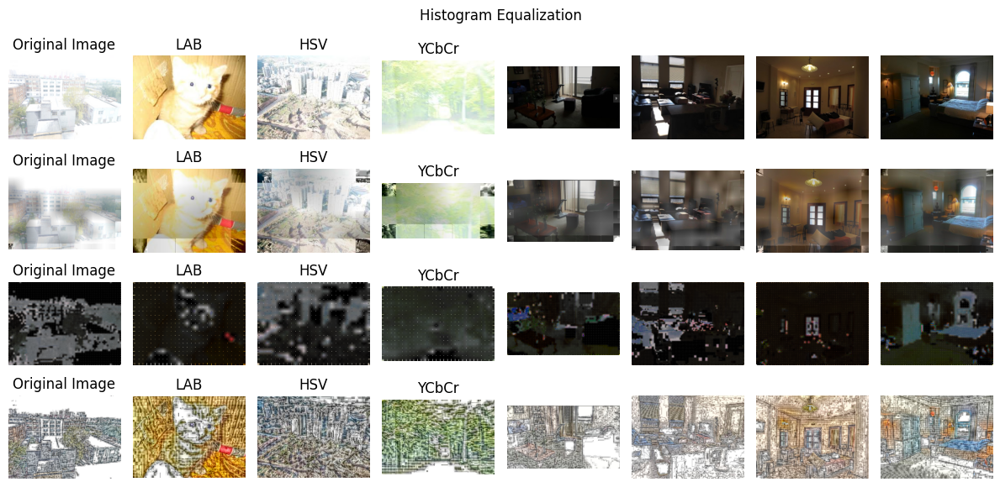

In [105]:
interlab_ahe_result = inter_aheForList(copy.deepcopy(img_lab), 0, (64,64))
# interhsv_ahe_result = inter_aheForList(img_hsv, 2, (9,9))
# interycbcr_ahe_result = inter_aheForList(img_ycbcr, 0, (7,7))
displayColorSpace([img_rgb, interlab_ahe_result, interhsv_ahe_result, interycbcr_ahe_result])

(-0.5, 548.5, 404.5, -0.5)

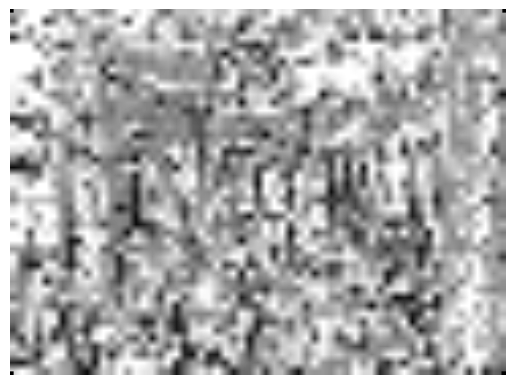

In [80]:
# display([cvtRGB([img_lab[6]], cv2.COLOR_Lab2RGB)[0]], [])
# inter_img = interpol_ahe(img_lab[6].copy(), 0)
# claImg = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
# t_channel = claImg.apply(img_lab[6].copy()[:,:,0])
# inter_img = cv2.cvtColor(inter_img, cv2.COLOR_LAB2RGB)
# plt.imshow(inter_img[:,:,0], cmap='gray')
# plt.axis('off')
# plt.imshow(lab_inter_ahe_result[6][:,:,0], cmap='gray')
# plt.axis('off')
# print(t_channel.shape)
# plt.imshow(t_channel, cmap='gray')
# plt.axis('off')

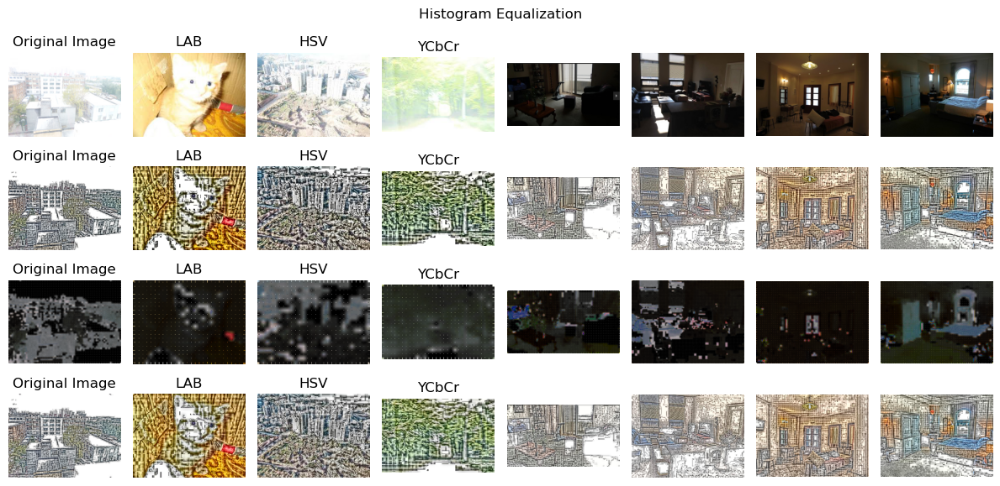

In [179]:
lab_inter_ahe_result = interpol_aheForList(img_lab, 0, (128,128))
# hsv_inter_ahe_result = interpol_aheForList(img_hsv, 2, (64,64))
# ycbcr_inter_ahe_result = interpol_aheForList(img_ycbcr, 0, (32,32))
displayColorSpace([img_rgb, lab_inter_ahe_result, hsv_inter_ahe_result, ycbcr_inter_ahe_result])

In [36]:
def mirror_pad_image(image, pad_size):
    padded_image = cv2.copyMakeBorder(image, pad_size, pad_size, pad_size, pad_size, cv2.BORDER_REFLECT)
    return padded_image

def all_conv_ahe2(_img, channel=0, _kernel_size=(7,7)):
    shape = _img.shape
    # count = np.zeros(shape)
    _res = np.zeros(shape)
    k = math.floor(_kernel_size[0]/2)
    # h = shape[0] - _kernel_size[0] + 1
    # w = shape[1] - _kernel_size[1] + 1
    padded_img = mirror_pad_image(_img, k)
    for i in tqdm(range(shape[0])):
        for j in range(shape[1]):
            temp = all_he([padded_img[i:i + _kernel_size[0], j:j + _kernel_size[1], :]], channel)
            _res[i, j, :] += temp[0][k, k, :]
            # count[i:i + _kernel_size[0], j:j + _kernel_size[1], :] += 1
    # _res = _res/count
    return _res.astype(np.uint8)

def conv_aheForList2(_imgs, channel=0, _kernel_size=(7,7)):
    _res = list()
    for _img in _imgs:
        _res.append(all_conv_ahe2(_img, channel, _kernel_size))
    return _res

In [75]:
# lab_conv_result2 = aheForList(img_lab, 0)
ew = img_lab[6]
lab_ahe_result2 = conv_aheForList([ew], 0, (64,64))
# hsv_conv_result2 = conv_aheForList2(img_hsv, 2)
# ycbcr_conv_result2 = conv_aheForList2(img_ycbcr, 0)
# displayColorSpace([img_rgb, lab_ahe_result2])#, hsv_conv_result2, ycbcr_conv_result2])

100%|██████████| 345/345 [06:19<00:00,  1.10s/it]


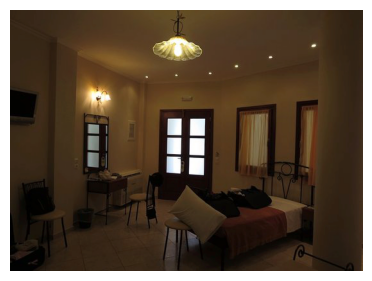

In [180]:
display([cvtRGB([img_lab[6]], cv2.COLOR_Lab2RGB)[0]], [])

In [44]:
conv_ahe_img3 = all_conv_ahe(img_lab[5], 0,(150,150))
conv_ahe_img3 = cv2.cvtColor(conv_ahe_img3, cv2.COLOR_LAB2RGB)

100%|██████████| 534/534 [47:57<00:00,  5.39s/it]


(-0.5, 909.5, 682.5, -0.5)

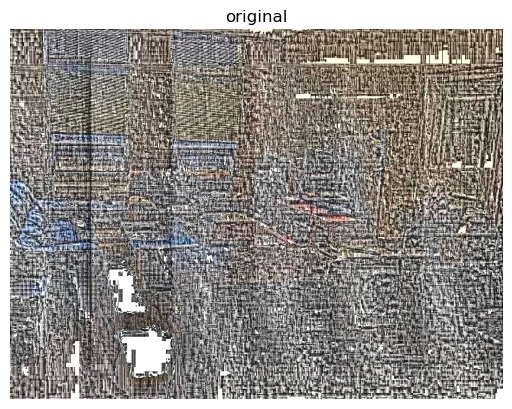

In [45]:
plt.imshow(conv_ahe_img3)
plt.title('original')
plt.axis('off')

In [136]:
def horizontal_he(_img, channel=0):
    shape = _img.shape
    count = np.zeros(shape)
    _res = np.zeros(shape)
    # h = shape[0] - _kernel_size[0] + 1
    # w = shape[1] - _kernel_size[1] + 1
    for i in tqdm(range(shape[0])):
        temp = all_he([np.reshape(_img[i], (1,shape[1],3))], channel)
        # if np.ndim(temp) == 3:
        #     temp = np.reshape(temp, (-1,3))
        _res[i, :, :] += temp[0][0]
        # count[i, :, :] += 1
    # _res = _res/count
    return _res.astype(np.uint8)

def horizaontal_heForList(_imgs, channel=0):
    _res = list()
    for _img in _imgs:
        _res.append(horizontal_he(_img, channel))
    return _res

100%|██████████| 683/683 [00:00<00:00, 3030.62it/s]


(-0.5, 909.5, 682.5, -0.5)

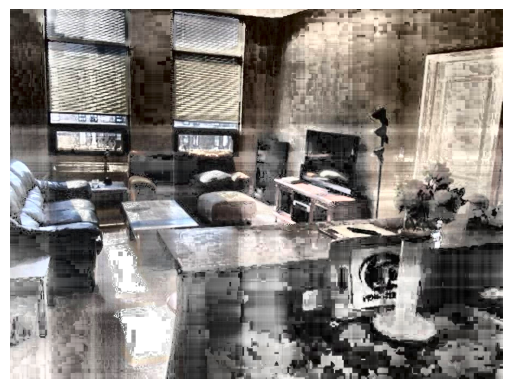

In [155]:
ew = img_lab[5].copy()
x = horizaontal_heForList([ew], 0)
plt.imshow(cv2.cvtColor(x[0], cv2.COLOR_LAB2RGB))
plt.axis('off')

In [88]:
def vertical_ahe(_img, channel=0):
    shape = _img.shape
    # count = np.zeros(shape)
    _res = np.zeros(shape)
    # h = shape[0] - _kernel_size[0] + 1
    # w = shape[1] - _kernel_size[1] + 1
    # print(shape)
    for j in tqdm(range(shape[1])):
        # print(_img[:,j, :].shape)
        n = np.reshape(_img[:,j, :], (shape[0], 1, 3))
        # print(n.shape)
        temp = all_he([n], channel)
        # if np.ndim(temp) == 3:
        #     temp = np.reshape(temp, (-1,3))
        # print(temp)
        # print(_res[:, j, :].shape)
        _res[:, j, :] += np.reshape(temp[0], (shape[0], 3))
        # count[i, :, :] += 1
    # _res = _res/count
    return _res.astype(np.uint8)

def vertical_aheForList(_imgs, channel=0):
    _res = list()
    for _img in _imgs:
        _res.append(vertical_ahe(_img, channel))
    return _res

100%|██████████| 910/910 [00:00<00:00, 2609.36it/s]


(-0.5, 909.5, 682.5, -0.5)

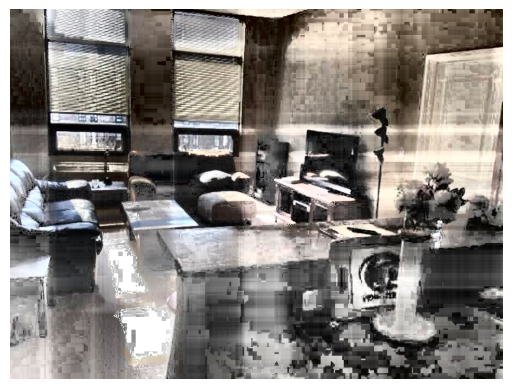

In [156]:
owie = img_lab[5].copy()
owie = vertical_ahe(owie, 0)
plt.imshow(cv2.cvtColor(owie, cv2.COLOR_LAB2RGB))
plt.axis('off')

In [ ]:
# ahe_img_2 = ahe(img, (32, 32))
# ahe_img_2 = cv2.cvtColor(ahe_img_2, cv2.COLOR_LAB2BGR)
# ahe_img_2 = cv2.cvtColor(ahe_img_2, cv2.COLOR_BGR2RGB)

(-0.5, 639.5, 479.5, -0.5)

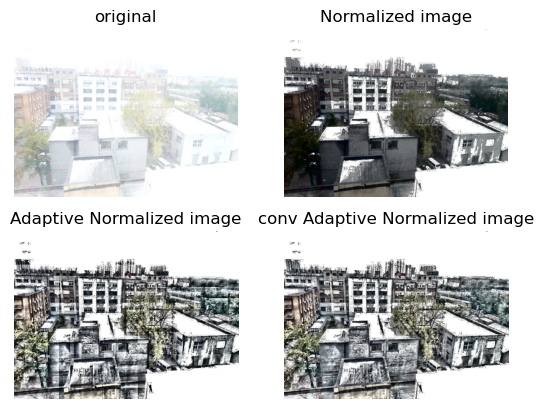

In [ ]:
# plt.subplot(2, 2, 1)
# plt.imshow(img)
# plt.title('original')
# plt.axis('off')
#
# plt.subplot(2, 2, 2)
# plt.imshow(rgb_image)
# plt.title('Normalized image')
# plt.axis('off')
#
# plt.subplot(2, 2, 3)
# plt.imshow(ahe_img_2)
# plt.title('Adaptive Normalized image')
# plt.axis('off')
#
# plt.subplot(2, 2, 4)
# plt.imshow(conv_ahe_img_2)
# plt.title('conv Adaptive Normalized image')
# plt.axis('off')

100%|██████████| 433/433 [03:03<00:00,  2.36it/s]


(-0.5, 639.5, 479.5, -0.5)

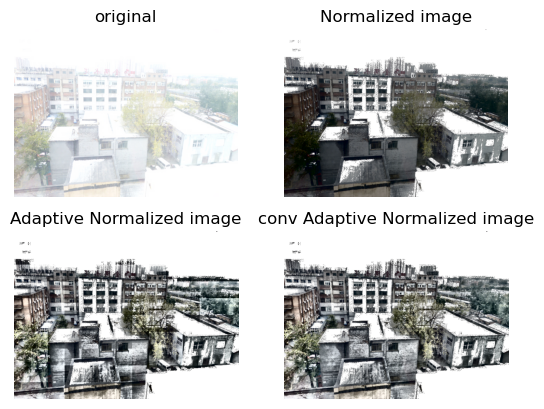

In [ ]:
# conv_ahe_img_3 = conv_ahe(img, (48, 48))
# conv_ahe_img_3 = cv2.cvtColor(conv_ahe_img_3, cv2.COLOR_LAB2BGR)
# conv_ahe_img_3 = cv2.cvtColor(conv_ahe_img_3, cv2.COLOR_BGR2RGB)
# ahe_img_3 = ahe(img, (48, 48))
# ahe_img_3 = cv2.cvtColor(ahe_img_3, cv2.COLOR_LAB2BGR)
# ahe_img_3 = cv2.cvtColor(ahe_img_3, cv2.COLOR_BGR2RGB)
# plt.subplot(2, 2, 1)
# plt.imshow(img)
# plt.title('original')
# plt.axis('off')
#
# plt.subplot(2, 2, 2)
# plt.imshow(rgb_image)
# plt.title('Normalized image')
# plt.axis('off')
#
# plt.subplot(2, 2, 3)
# plt.imshow(ahe_img_3)
# plt.title('Adaptive Normalized image')
# plt.axis('off')
#
# plt.subplot(2, 2, 4)
# plt.imshow(conv_ahe_img_3)
# plt.title('conv Adaptive Normalized image')
# plt.axis('off')

100%|██████████| 381/381 [10:14<00:00,  1.61s/it]


(-0.5, 639.5, 479.5, -0.5)

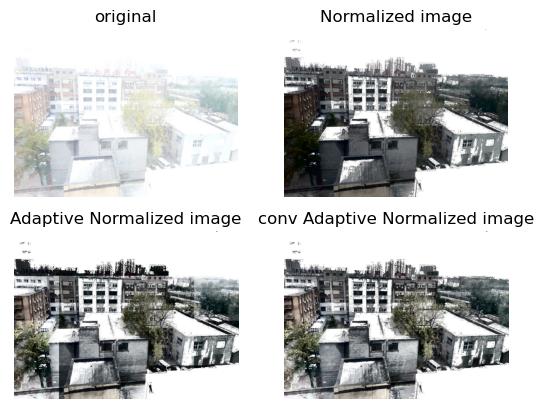

In [ ]:
# conv_ahe_img_4 = conv_ahe(img, (100, 100))
# conv_ahe_img_4 = cv2.cvtColor(conv_ahe_img_4, cv2.COLOR_LAB2BGR)
# conv_ahe_img_4 = cv2.cvtColor(conv_ahe_img_4, cv2.COLOR_BGR2RGB)
# plt.subplot(2, 2, 1)
# plt.imshow(img)
# plt.title('original')
# plt.axis('off')
#
# plt.subplot(2, 2, 2)
# plt.imshow(rgb_image)
# plt.title('Normalized image')
# plt.axis('off')
#
# plt.subplot(2, 2, 3)
# plt.imshow(ahe_img)
# plt.title('Adaptive Normalized image')
# plt.axis('off')
#
# plt.subplot(2, 2, 4)
# plt.imshow(conv_ahe_img_4)
# plt.title('conv Adaptive Normalized image')
# plt.axis('off')

weighted sum

In [90]:
def l_weighted_sum(_origin, _processed, ratio=0.5):
    _l, _a, _b = lab(_origin)
    _L, _A, _B = lab(_processed)
    ll = (_l*(1-ratio) + _L*ratio)
    ll = ll.astype(np.uint8)
    _res = cv2.merge([ll, _a, _b])
    _res = _res.astype(np.uint8)
    _res = cv2.cvtColor(_res, cv2.COLOR_LAB2BGR)
    _res = cv2.cvtColor(_res, cv2.COLOR_BGR2RGB)
    return _res

def weighted_sum(_origin, _processed, channel=0, ratio=0.5):
    _l = _origin[:,:,channel]
    _L = _processed[:,:,channel]
    ll = (_l*(1-ratio) + _L*ratio)
    ll = ll.astype(np.uint8)
    # _res = cv2.merge([ll, _a, _b])
    _res = _origin.copy()
    _res[:,:, channel] = ll
    _res = _res.astype(np.uint8)
    # _res = cv2.cvtColor(_res, cvt)
    # _res = cv2.cvtColor(_res, cv2.COLOR_BGR2RGB)
    return _res

def weighted_sumList(_origin_list, _processed_list, channel=0, ratio=0.5):
    _res = list()
    for i in range(len(_origin_list)):
        _res.append(weighted_sum(_origin_list[i], _processed_list[i], channel, ratio)) 
    return _res

# ws = l_weighted_sum(img, conv_ahe_img, 0.6)
# ws = weighted_sumList([cv2.cvtColor(img, cv2.COLOR_RGB2LAB)], [cv2.cvtColor(conv_ahe_img, cv2.COLOR_RGB2LAB)])[0]
# display([img, rgb_image, ahe_img, conv_ahe_img, ws], ["original", "Normalized", "Adaptive HE", "Conv Adaptive HE", "Weighted Sum AHE"])

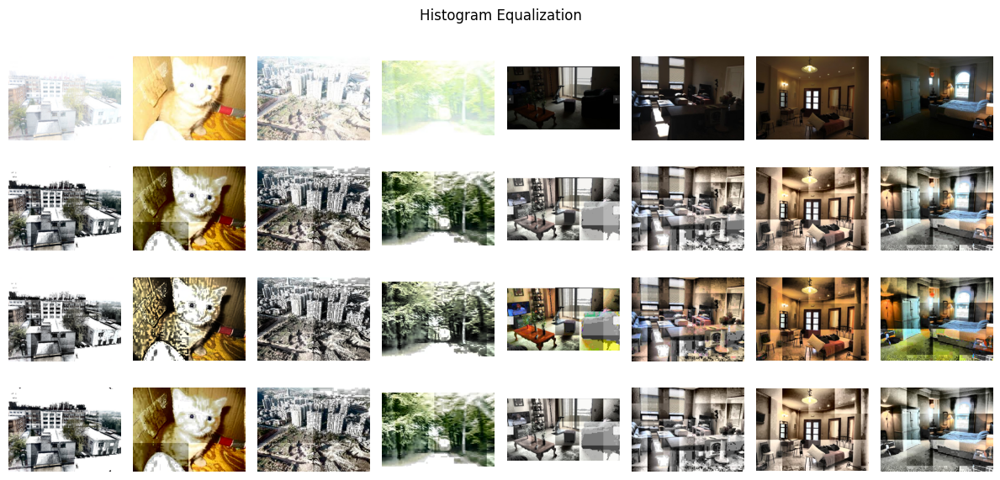

In [ ]:
lab_ws_result = weighted_sumList(img_lab, lab_ahe_result, 0, 0.6)
hsv_ws_result = weighted_sumList(img_hsv, hsv_ahe_result, 2, 0.6)
ycbcr_ws_result = weighted_sumList(img_ycbcr, ycbcr_ahe_result, 0, 0.6)
displayColorSpace([img_rgb, lab_ws_result, hsv_ws_result, ycbcr_ws_result])

In [57]:
ahe_grid_32 = all_ahe(img_lab[5], 0, (32,32))
ahe_grid_64 = all_ahe(img_lab[5], 0, (64,64))
ahe_grid_128 = all_ahe(img_lab[5], 0, (128,128))


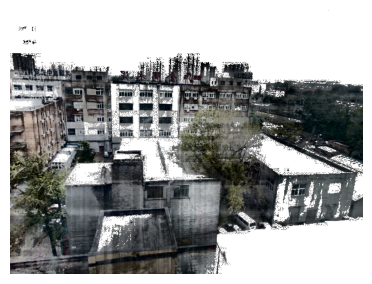

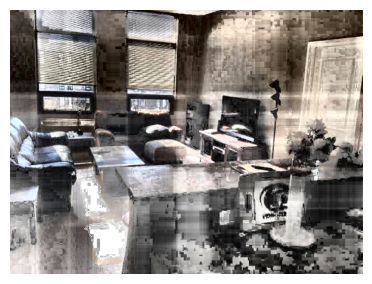

In [157]:
# ahe_sum = weighted_sum(ahe_grid_32, ahe_grid_64, 0)
# ahe_sum = weighted_sum(ahe_sum, )
display([cvtRGB([img_lab[0]], cv2.COLOR_Lab2RGB)[0]], [])
# displayColorSpace([[], [ahe_grid_32, ahe_grid_64, ahe_grid_128]])
a = weighted_sum(x[0], owie)
display([cvtRGB([a], cv2.COLOR_Lab2RGB)[0]], [])

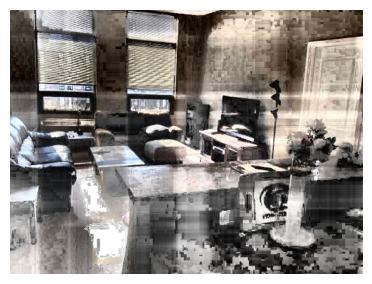

In [158]:
b = weighted_sum(a, img_lab[5].copy())
display([cvtRGB([b], cv2.COLOR_Lab2RGB)[0]], [])

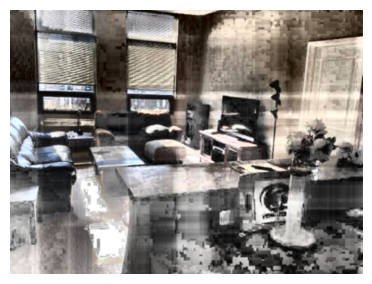

In [159]:
g_blur = cv2.GaussianBlur(b[:,:,0], (5,5), 0)
b[:,:,0] = g_blur
display([cvtRGB([b], cv2.COLOR_Lab2RGB)[0]], [])

(-0.5, 549.5, 411.5, -0.5)

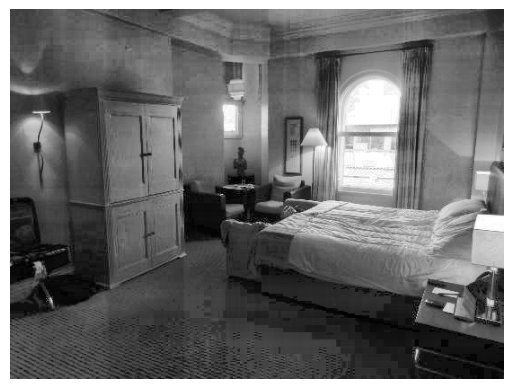

In [104]:
plt.imshow(b[:,:,0], cmap='gray')
plt.axis('off')

100%|██████████| 550/550 [00:00<00:00, 3500.62it/s]


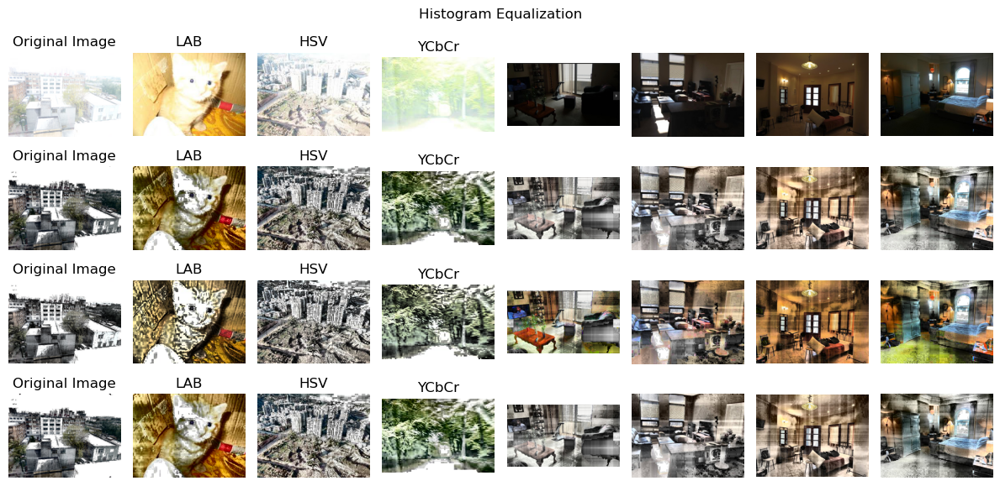

In [137]:
lab_hhe_result = horizaontal_heForList(img_lab,0)
lab_vhe_result = vertical_aheForList(img_lab,0)

hsv_hhe_result = horizaontal_heForList(img_hsv,2)
hsv_vhe_result = vertical_aheForList(img_hsv,2)

ycbcr_hhe_result = horizaontal_heForList(img_ycbcr,0)
ycbcr_vhe_result = vertical_aheForList(img_ycbcr,0)
cross_he_lab_result = weighted_sumList(lab_hhe_result, lab_vhe_result,0)
cross_he_hsv_result = weighted_sumList(hsv_hhe_result, hsv_vhe_result,2)
cross_he_ycbcr_result = weighted_sumList(ycbcr_hhe_result, ycbcr_vhe_result,0)

cross_lab_ws_result = weighted_sumList(img_lab, cross_he_lab_result,0)
cross_hsv_ws_result = weighted_sumList(img_hsv, cross_he_hsv_result,2)
cross_ycbcr_ws_result = weighted_sumList(img_ycbcr, cross_he_ycbcr_result,0)
displayColorSpace([img_rgb, cross_lab_ws_result, cross_hsv_ws_result, cross_ycbcr_ws_result])

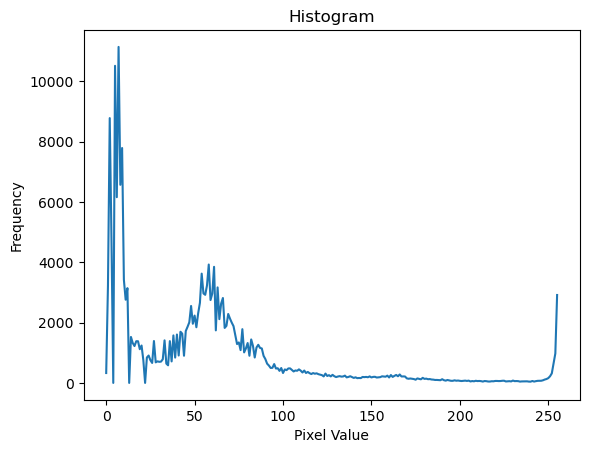

Mean: 55.83427625772286 Std: 54.70333969000922


In [125]:
histogram = cv2.calcHist([img_lab[7][:,:,0]], [0], None, [256], [0, 256])
plt.plot(histogram)
plt.title("Histogram")
plt.xlabel("Pixel Value")
plt.ylabel("Frequency")
plt.show()
print("Mean:", np.mean(img_lab[7][:,:,0]), "Std:",  np.std(img_lab[7][:,:,0]))

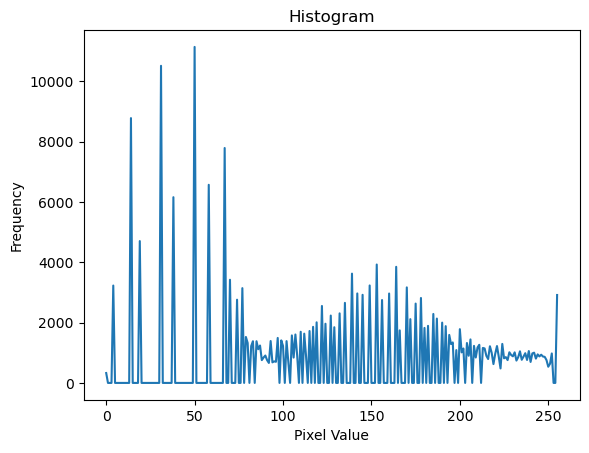

Mean: 129.42655339805825 Std: 72.31025361999998


In [127]:
histogram = cv2.calcHist([lab_he_result[7][:,:,0]], [0], None, [256], [0, 256])
plt.plot(histogram)
plt.title("Histogram")
plt.xlabel("Pixel Value")
plt.ylabel("Frequency")
plt.show()
print("Mean:", np.mean(lab_he_result[7][:,:,0]), "Std:",  np.std(lab_he_result[7][:,:,0]))

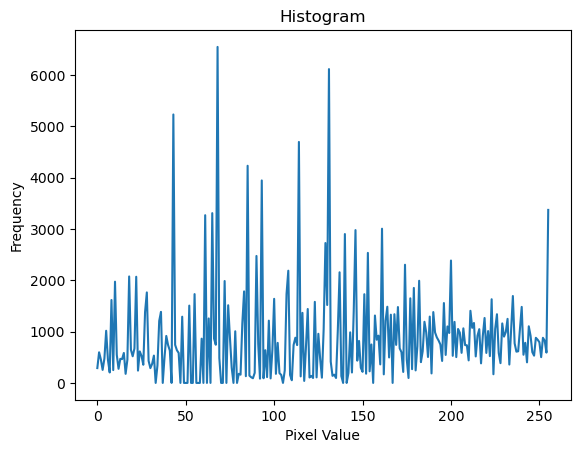

Mean: 132.55172109443953 Std: 71.63636906341266


In [129]:
histogram = cv2.calcHist([lab_ahe_result[7][:,:,0]], [0], None, [256], [0, 256])
plt.plot(histogram)
plt.title("Histogram")
plt.xlabel("Pixel Value")
plt.ylabel("Frequency")
plt.show()
print("Mean:", np.mean(lab_ahe_result[7][:,:,0]), "Std:",  np.std(lab_ahe_result[7][:,:,0]))

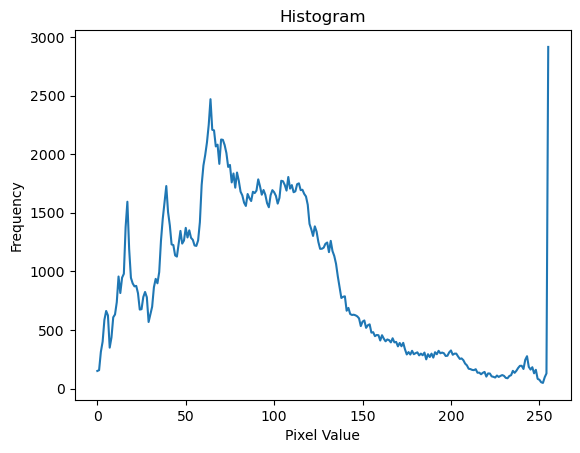

Mean: 93.9636054721977 Std: 53.39000756288991


In [131]:
histogram = cv2.calcHist([b[:,:,0]], [0], None, [256], [0, 256])
plt.plot(histogram)
plt.title("Histogram")
plt.xlabel("Pixel Value")
plt.ylabel("Frequency")
plt.show()
print("Mean:", np.mean(b[:,:,0]), "Std:",  np.std(b[:,:,0]))

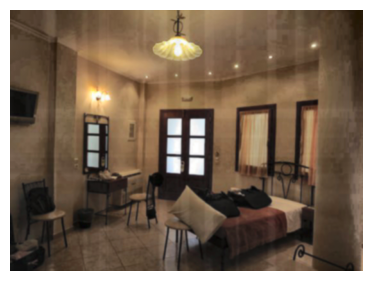

In [107]:
g_blur = cv2.GaussianBlur(b[:,:,0], (5,5), 0)
b[:,:,0] = g_blur
display([cvtRGB([b], cv2.COLOR_Lab2RGB)[0]], [])

In [ ]:
def show_img_hist(ori_image, ori_rgb_image, eq_image, eq_rgb_image, channel_to_plot):
    fig, axs = plt.subplots(2, 2)

    axs[0, 0].imshow(ori_rgb_image)
    axs[0, 0].set_title('Original Image')
    axs[0, 0].axis('off')

    hist = cv2.calcHist([ori_image],[channel_to_plot],None,[256],[0,256])
    axs[0,1].plot(hist)
    axs[0,1].set_title('Original Histogram')

    axs[1, 0].imshow(eq_rgb_image)
    axs[1, 0].set_title('CLAHE Enhanced Image')
    axs[1, 0].axis('off')

    hist = cv2.calcHist([eq_image],[0],None,[256],[0,256])
    axs[1,1].plot(hist) 
    axs[1,1].set_title('CLAHE Histogram')
    plt.tight_layout()
# CLAHE on LAB model
def clahe_lab_model(img_lab):

    clahe_lab = []

    for i in range (len(img_lab)):
        lab_img = img_lab[i]
        # lab_img = cv2.cvtColor(image, cv2.COLOR_BGR2Lab)
        ori_img = cv2.cvtColor(lab_img,cv2.COLOR_LAB2RGB)
        l, a, b = cv2.split(lab_img)
        clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
        clahe_l = clahe.apply(l)
        clahe_lab_img = cv2.merge((clahe_l,a,b))
        clahe_image= cv2.cvtColor(clahe_lab_img, cv2.COLOR_LAB2RGB)
        clahe_lab.append(clahe_image)

        # show_img_hist(lab_img, ori_img, clahe_lab_img, clahe_image, 0)

    return clahe_lab




# CLAHE on HSV model
def clahe_hsv_model(img_hsv):

    clahe_hsv = []

    for i in range (len(img_hsv)):
        hsv_img = img_hsv[i]
        ori_img = cv2.cvtColor(hsv_img,cv2.COLOR_HSV2RGB)
        h, s, v = cv2.split(hsv_img)
        clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
        clahe_v = clahe.apply(v)
        clahe_hsv_img = cv2.merge((h,s,clahe_v))
        clahe_image= cv2.cvtColor(clahe_hsv_img, cv2.COLOR_HSV2RGB)
        clahe_hsv.append(clahe_image)

        # show_img_hist(hsv_img, ori_img, clahe_hsv_img, clahe_image, 2)

    return clahe_hsv

# CLAHE on YCbCr model
def clahe_ycbcr_model(img_ycbcr):

    clahe_ycbcr = []
    for i in range (len(img_ycbcr)):
        ycbcr_img = img_ycbcr[i]
        ori_img = cv2.cvtColor(ycbcr_img,cv2.COLOR_YCrCb2RGB)
        y, cb, cr = cv2.split(ycbcr_img)
        clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
        clahe_y = clahe.apply(y)
        clahe_ycbcr_img = cv2.merge((clahe_y,cb,cr))
        clahe_image= cv2.cvtColor(clahe_ycbcr_img, cv2.COLOR_YCrCb2RGB)
        clahe_ycbcr.append(clahe_image)

        # show_img_hist(ycbcr_img, ori_img, clahe_ycbcr_img, clahe_image, 0)

    return clahe_ycbcr
# clahe(img_ycbcr)
clahe_ycbcr = clahe_ycbcr_model(img_ycbcr)
clahe_hsv = clahe_hsv_model(img_hsv)
clahe_lab = clahe_lab_model(img_lab)

def display_result(img_rgb, clahe_ycbcr,clahe_hsv,clahe_lab):
    fig, ax = plt.subplots(4,8, figsize=(12,6))
    fig.suptitle('Contrast Limited Adaptive Histogram Equalization')

    for i in range (len(img_rgb)):
        ax[0,i].imshow(img_rgb[i])
        ax[0,i].axis('off')
        ax[0,i].set_title('Original Image')
        ax[1,i].imshow(clahe_lab[i])
        ax[1,i].axis('off')
        ax[1,i].set_title('CLAHE-LAB')
        ax[2,i].imshow(clahe_hsv[i])
        ax[2,i].axis('off')
        ax[2,i].set_title('CLAHE-HSV')
        ax[3,i].imshow(clahe_ycbcr[i])
        ax[3,i].axis('off')
        ax[3,i].set_title('CLAHE-YCrBr')

        plt.tight_layout()
        
display_result(img_rgb, clahe_ycbcr,clahe_hsv,clahe_lab)